In [1]:
import os
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch
import torch.nn as nn
from torch.optim import SGD, Adam
from torch.utils.data import DataLoader, TensorDataset, Dataset, random_split
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
import random
import math
import torch.nn.functional as F
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
import torchvision.models as models

print(device)

cuda:0


In [2]:
classes = [folder for folder in os.listdir("dataset") if os.path.isdir(os.path.join("dataset", folder))]
print(f"Class: {len(classes)}")
# Print the folder names
for clss in classes:
    print(clss)

Class: 11
snow
rain
rainbow
sandstorm
rime
hail
dew
lightning
frost
fogsmog
glaze


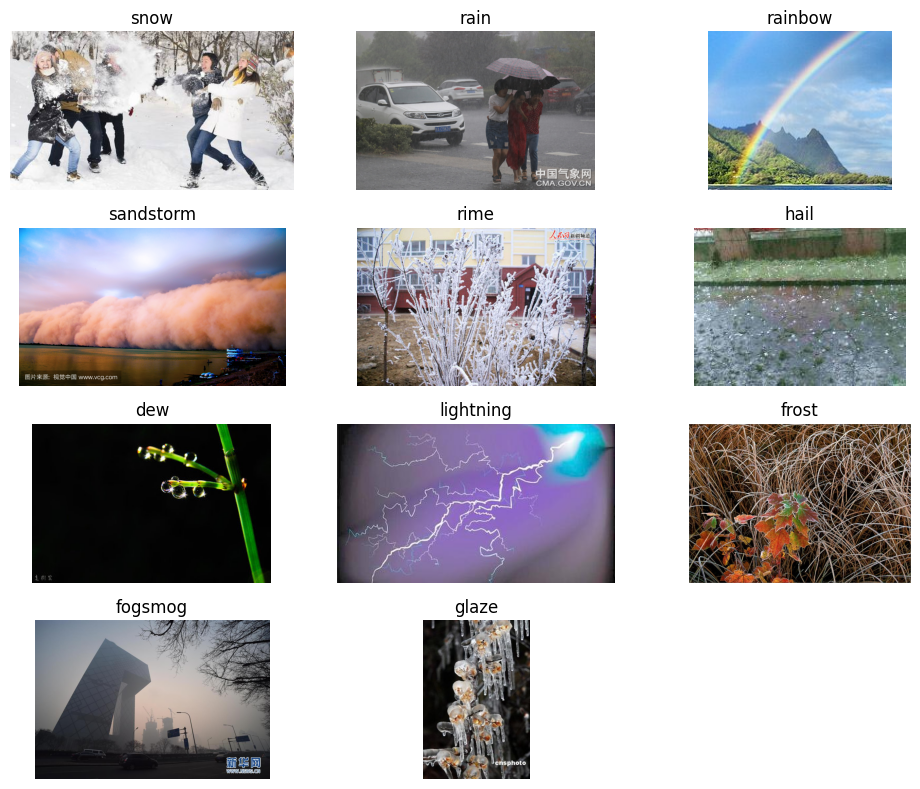

In [3]:
# Przykładowe zdjecie z każdej klasy
n_cols = 3
n_rows = len(classes) // n_cols + (len(classes) % n_cols > 0)

plt.figure(figsize=(10, n_rows * 2))

for idx, clss in enumerate(classes):
    class_folder = os.path.join("dataset", clss)
    all_files = [f for f in os.listdir(class_folder) if os.path.isfile(os.path.join(class_folder, f))]
    random_file = random.choice(all_files)
    img_path = os.path.join(class_folder, random_file)
    img = Image.open(img_path)
    plt.subplot(n_rows, n_cols, idx + 1)  
    plt.imshow(img)
    plt.title(clss)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [4]:
transform = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(),
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

data = "./dataset"
dataset = ImageFolder(root=data, transform=transform)

In [5]:
# Podział danych 80-20
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# VGG16

In [6]:
vgg16 = models.vgg16(pretrained=True)
num_classes = 11
vgg16.classifier[6] = nn.Linear(vgg16.classifier[6].in_features, num_classes)
vgg16 = vgg16.to(device)


def train(model, train_loader, optimizer, criterion, device):
    model.train()
    train_loss, train_acc = 0.0, 0.0
    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * data.size(0)
        _, preds = torch.max(output, 1)
        train_acc += torch.sum(preds == target.data)
    train_loss /= len(train_loader.dataset)
    train_acc /= len(train_loader.dataset)
    return train_loss, train_acc

def test(model, test_loader, criterion, device):
    model.eval()
    test_loss, test_acc = 0.0, 0.0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            test_loss += loss.item() * data.size(0)
            _, preds = torch.max(output, 1)
            test_acc += torch.sum(preds == target.data)
    test_loss /= len(test_loader.dataset)
    test_acc /= len(test_loader.dataset)
    return test_loss, test_acc


def fit(model, train_loader, test_loader, optimizer, criterion, device, epochs=50):
    import time
    prev_t = time.time()

    history = {
        "train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }

    for epoch in range(epochs):

        train_loss, train_acc = train(model, train_loader, optimizer, criterion, device)
        test_loss, test_acc = test(model, test_loader, criterion, device)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc.cpu())
        history["test_loss"].append(test_loss)
        history["test_acc"].append(test_acc.cpu())

        # print metrics each second
        if time.time() - prev_t > 1 or epoch < 1 or epoch == epochs - 1:
            print(
                f"Epoch {epoch + 1}: Train Loss={train_loss:.4f}, Train Acc={train_acc:.4f}, Test Loss={test_loss:.4f}, Test Acc={test_acc:.4f}        ",
                end='\r')
            prev_t = time.time()

    return history


/home/witek/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/witek/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [7]:
def plot_history(hist):
    fig = plt.figure(figsize=(12, 5))
    ax = fig.add_subplot(1, 2, 1)
    ax.plot(hist['train_loss'][1:], lw=1, label="train_loss")
    ax.plot(hist['test_loss'][1:], lw=1, label="test_loss")
    ax.set_title('Funkcja straty uczenia', size=15)
    ax.set_xlabel('Epoka', size=15)
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.legend(loc='upper right')

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(hist['train_acc'][1:], lw=1, label="train_acc")
    ax.plot(hist['test_acc'][1:], lw=1, label="test_acc")
    ax.set_title('Dokładność uczenia', size=15)
    ax.set_xlabel('Epoka', size=15)
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.legend(loc='lower right')
    plt.tight_layout()

    plt.show()


===== BATCH SIZE: 32, LEARNING RATE: 0.001 =====


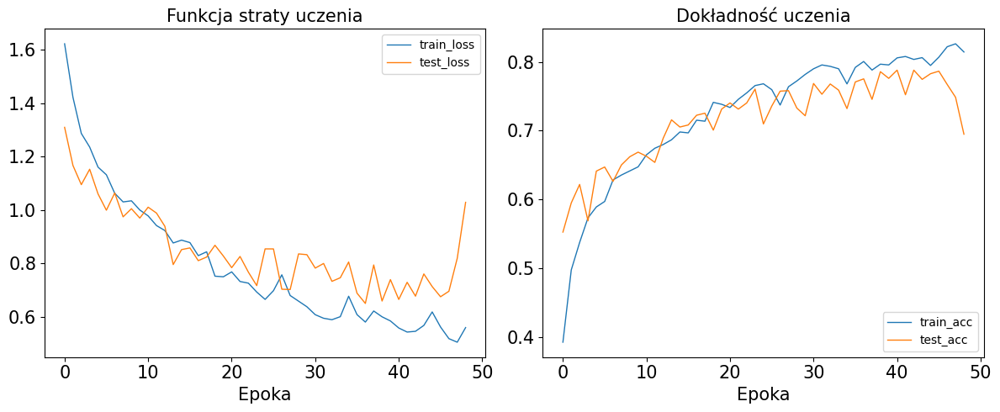

In [8]:
batch_size = 32
rate = 0.001

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

optimizer = Adam(vgg16.parameters(), lr=rate)
criterion = nn.CrossEntropyLoss()
print(f"===== BATCH SIZE: {batch_size}, LEARNING RATE: {rate} =====")
history = fit(vgg16, train_loader, test_loader, optimizer, criterion, device)
plot_history(history)


In [9]:
print(vgg16)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [10]:
def predict_image(image_path, model, transform):
    model.eval()
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
        prediction = output.argmax(dim=1, keepdim=True) 
    return prediction.item() 

def display_grid_comparisons(dataset, model, transform, num_rows, num_cols):
    plt.figure(figsize=(5 * num_cols, 5 * num_rows))
    for i in range(num_rows * num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        idx = random.randint(0, len(dataset) - 1)
        path, true_label = dataset.dataset.samples[dataset.indices[idx]]
        pred_label = predict_image(path, model, transform) 
        image = Image.open(path)
        plt.imshow(image)
        plt.title(f"Real: {dataset.dataset.classes[true_label]}\nPredicted: {dataset.dataset.classes[pred_label]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()




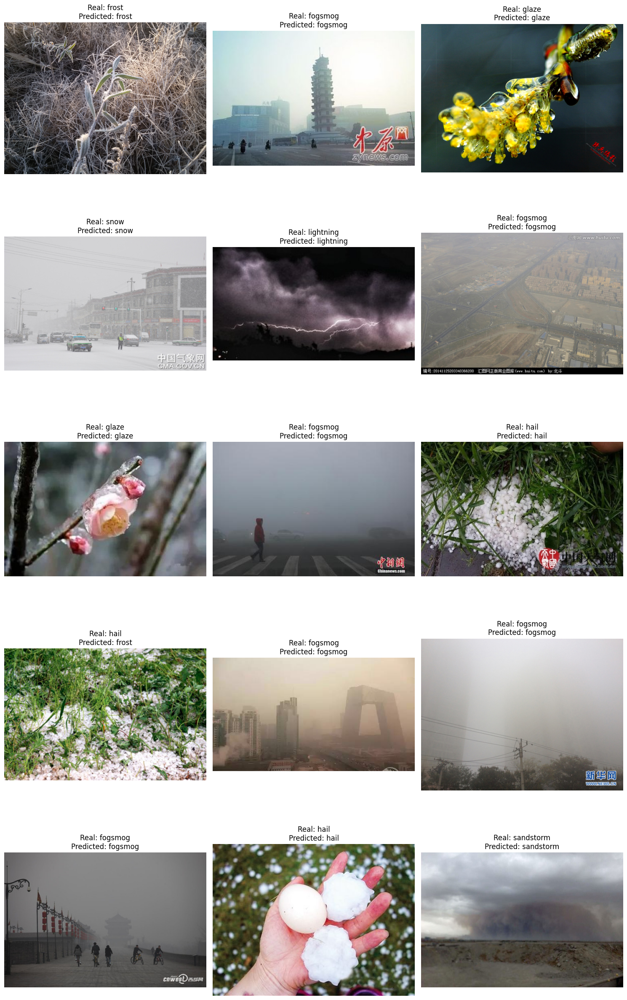

In [11]:
display_grid_comparisons(test_dataset, vgg16, transform, num_rows=5, num_cols=3)

# RESNET50

In [12]:
resnet50 = models.resnet50(pretrained=True)
num_classes = 11
resnet50.fc = nn.Linear(resnet50.fc.in_features, num_classes)
resnet50 = resnet50.to(device)

def train(model, train_loader, optimizer, criterion, device):
    model.train()
    train_loss, train_acc = 0.0, 0.0
    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * data.size(0)
        _, preds = torch.max(output, 1)
        train_acc += torch.sum(preds == target.data)
    train_loss /= len(train_loader.dataset)
    train_acc /= len(train_loader.dataset)
    return train_loss, train_acc

def test(model, test_loader, criterion, device):
    model.eval()
    test_loss, test_acc = 0.0, 0.0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            test_loss += loss.item() * data.size(0)
            _, preds = torch.max(output, 1)
            test_acc += torch.sum(preds == target.data)
    test_loss /= len(test_loader.dataset)
    test_acc /= len(test_loader.dataset)
    return test_loss, test_acc


def fit(model, train_loader, test_loader, optimizer, criterion, device, epochs=50):
    import time
    prev_t = time.time()

    history = {
        "train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }  

    for epoch in range(epochs):

        train_loss, train_acc = train(model, train_loader, optimizer, criterion, device)
        test_loss, test_acc = test(model, test_loader, criterion, device)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc.cpu())
        history["test_loss"].append(test_loss)
        history["test_acc"].append(test_acc.cpu())

        # print metrics each second
        if time.time() - prev_t > 1 or epoch < 1 or epoch == epochs - 1:
            print(
                f"Epoch {epoch + 1}: Train Loss={train_loss:.4f}, Train Acc={train_acc:.4f}, Test Loss={test_loss:.4f}, Test Acc={test_acc:.4f}        ",
                end='\r')
            prev_t = time.time()

    return history


/home/witek/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [13]:
def plot_history(hist):
    fig = plt.figure(figsize=(12, 5))
    ax = fig.add_subplot(1, 2, 1)
    ax.plot(hist['train_loss'][1:], lw=1, label="train_loss")
    ax.plot(hist['test_loss'][1:], lw=1, label="test_loss")
    ax.set_title('Funkcja straty uczenia', size=15)
    ax.set_xlabel('Epoka', size=15)
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.legend(loc='upper right')

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(hist['train_acc'][1:], lw=1, label="train_acc")
    ax.plot(hist['test_acc'][1:], lw=1, label="test_acc")
    ax.set_title('Dokładność uczenia', size=15)
    ax.set_xlabel('Epoka', size=15)
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.legend(loc='lower right')
    plt.tight_layout()

    plt.show()


===== BATCH SIZE: 32, LEARNING RATE: 0.001 =====


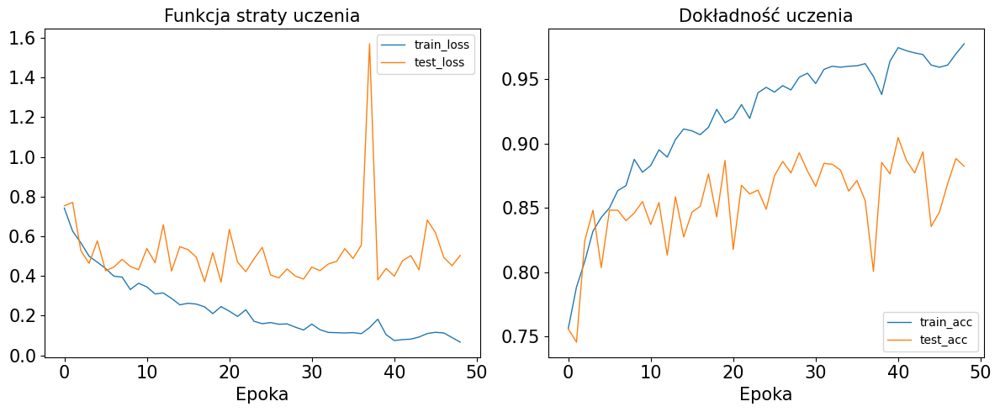

In [14]:
batch_size = 32
rate = 0.001

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

optimizer = Adam(resnet50.parameters(), lr=rate)
criterion = nn.CrossEntropyLoss()
print(f"===== BATCH SIZE: {batch_size}, LEARNING RATE: {rate} =====")
history = fit(resnet50, train_loader, test_loader, optimizer, criterion, device)
plot_history(history)


In [15]:
print(resnet50)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [16]:
def predict_image(image_path, model, transform):
    model.eval()
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
        prediction = output.argmax(dim=1, keepdim=True)
    return prediction.item()

def display_grid_comparisons(dataset, model, transform, num_rows, num_cols):
    plt.figure(figsize=(5 * num_cols, 5 * num_rows))
    for i in range(num_rows * num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        idx = random.randint(0, len(dataset) - 1)
        path, true_label = dataset.dataset.samples[dataset.indices[idx]]
        pred_label = predict_image(path, model, transform)
        image = Image.open(path)
        plt.imshow(image)
        plt.title(f"Real: {dataset.dataset.classes[true_label]}\nPredicted: {dataset.dataset.classes[pred_label]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

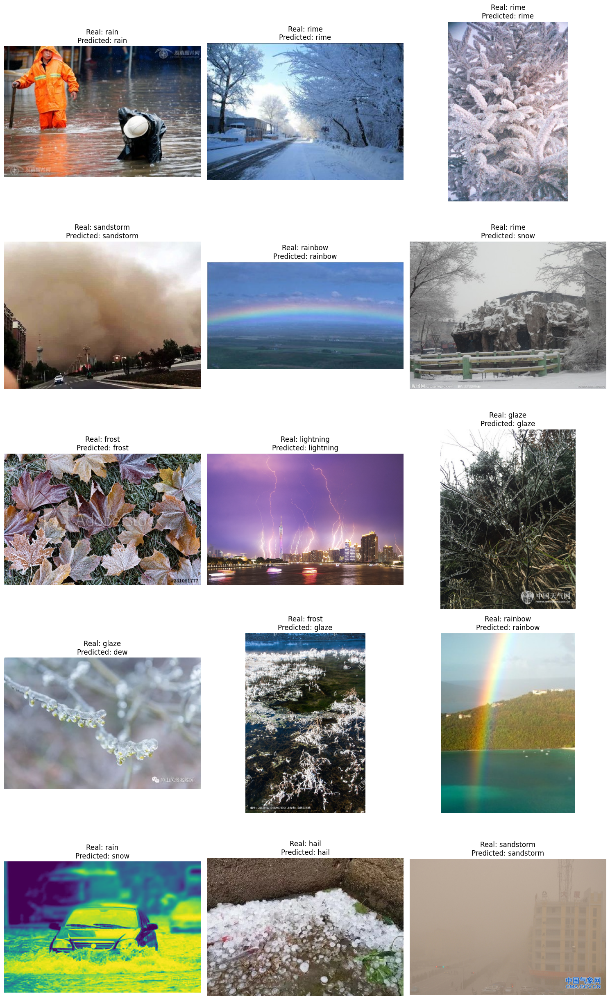

In [17]:
display_grid_comparisons(test_dataset, resnet50, transform, num_rows=5, num_cols=3)
